# Diabetes dataset

In [1]:
# importing the libraries

import numpy as np 
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('seaborn')

import pandasql as psql

# Ignore harmless warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# load the diabetes dataset

diadata = pd.read_csv(r"D:\iiit notes\Internship\20 season 8th jun-2021\diabetes.csv")
diadata.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
# Display the dataset information 

diadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [4]:
# Identify the independent and Target (dependent) variables

IndepVar =[]
for col in diadata.columns:
    if col != 'Outcome':
        IndepVar.append(col)

TargetVar = 'Outcome'        
        
x = diadata[IndepVar]
y = diadata[TargetVar]

In [5]:
# Feature Scaling - Scaling is done to Normalize data so that priority is not given to a particular feature. Role of Scaling 
# is mostly important in algorithms that are distance based and require Euclidean Distance. Random Forest is a tree-based model 
# and hence does not require feature scaling. 
from sklearn.preprocessing import StandardScaler 
ss = StandardScaler() 
x_ss = ss.fit_transform(x)

In [6]:
# Splitting the dataset into train and test 

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_ss, y, test_size = 0.3, random_state =42)

# Random Forest Classification

In [7]:
#  Build Random forest classification model and train the model using the training sets 

from sklearn.ensemble import RandomForestClassifier

diadataRF = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None, criterion='gini', 
                                                        max_depth=None, max_features='auto', max_leaf_nodes=None, 
                                                        max_samples=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                                                        min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, 
                                                        n_estimators=500, n_jobs=None, oob_score=False, random_state=0, 
                                                        verbose=0, warm_start=False)
diadataRF = diadataRF.fit(x_train,y_train)

In [8]:
# To display the algorithm parameters

params = diadataRF.get_params()
print(params)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}


In [9]:
# Predict the model with test dataset

y_pred = diadataRF.predict(x_test)

In [10]:
# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

Confusion matrix: 
 [[ 50  30]
 [ 31 120]]
Outcome Values : 
 50 30 31 120
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.62      0.62        80
           0       0.80      0.79      0.80       151

    accuracy                           0.74       231
   macro avg       0.71      0.71      0.71       231
weighted avg       0.74      0.74      0.74       231

Accuracy : 73.6 %
Precision : 61.7 %
Recall : 62.5 %
F1 Score : 0.621
Balanced Accuracy : 71.0 %
MCC 0.418
roc_auc_score: 0.71


Feature: 0, Score: 0.07768
Feature: 1, Score: 0.27139
Feature: 2, Score: 0.08531
Feature: 3, Score: 0.06990
Feature: 4, Score: 0.07086
Feature: 5, Score: 0.16517
Feature: 6, Score: 0.11323
Feature: 7, Score: 0.14646


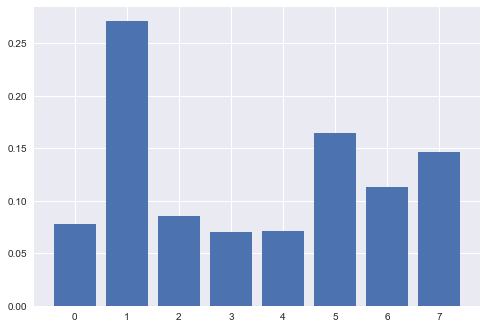

In [12]:
# To build the 'Logistic Regression' model with random sampling
# get importance
from matplotlib import pyplot
importance = diadataRF.feature_importances_

# Summarize feature importance
for i,j in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,j))

# Plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

# The positive scores indicate a feature that predicts class 1, 
# whereas the negative scores indicate a feature that predicts class 0.

In [13]:
# Display the Actual vs Predicted

CompResults = pd.DataFrame({'Outcome' : y_test, 'pred_Outcome': y_pred})
CompResults.head()

,Outcome,pred_Outcome
668,0,0
324,0,0
624,0,0
690,0,0
473,0,0


In [14]:
# Merge two Dataframes on index of both the dataframes

x_test = pd.DataFrame(x_test)
DSResults = x_test.merge(CompResults, left_index=True, right_index=True)
DSResults.head()

,0,1,2,3,4,5,6,7,Outcome,pred_Outcome
2,-0.547919,-0.403562,-0.263941,-1.288212,-0.692891,-0.151361,-0.947944,-1.041549,1,1
6,-0.844885,-1.561556,-1.091105,-0.159107,-0.032990,-1.471321,-0.449624,-0.956462,1,0
7,-1.141852,-0.121888,-3.572597,-1.288212,-0.692891,0.229397,1.389628,0.915469,0,1
10,1.827813,-0.309671,0.046245,0.405445,-0.692891,-0.570195,-0.999286,0.575118,0,0
23,-0.844885,-0.779128,-0.263941,0.405445,0.062521,0.153245,-0.552308,-1.041549,1,0


In [15]:
diadata.columns


Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [16]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI',
 'DiabetesPedigreeFunction', 'Age']

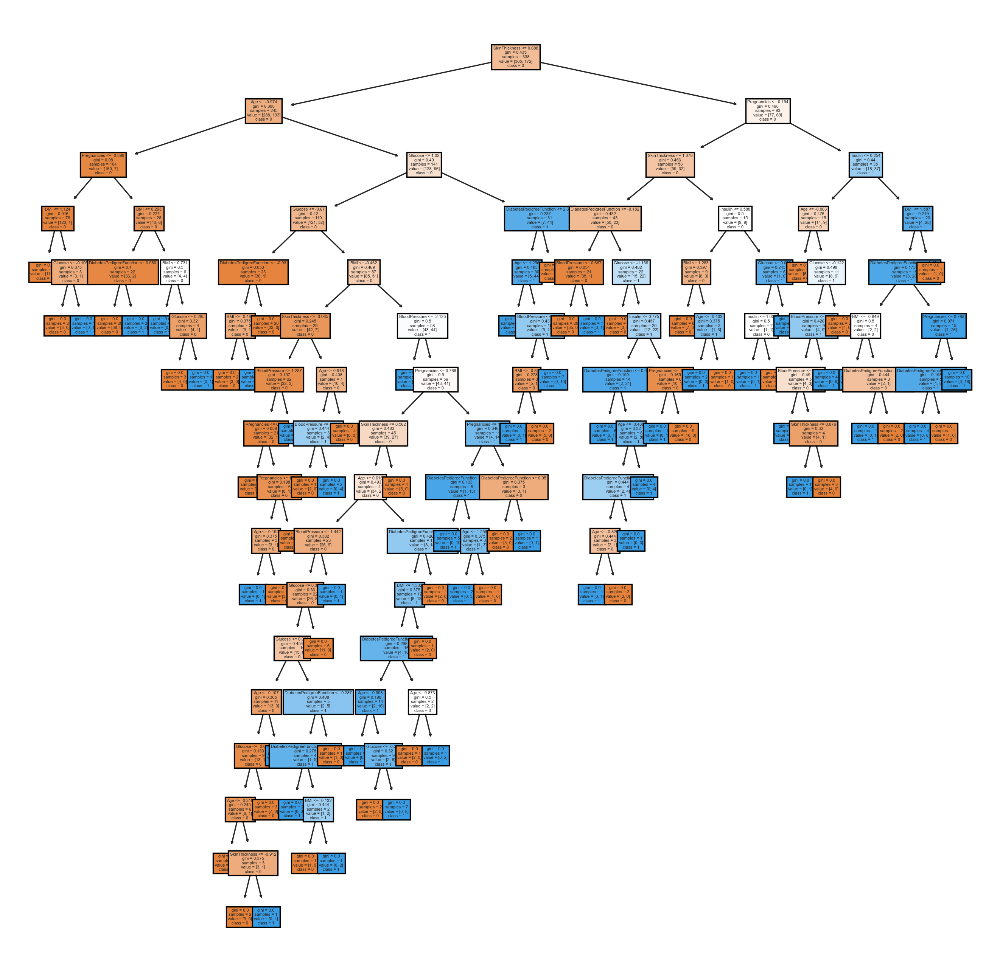

In [17]:
# Visualize individual trees and code below visualizes the first decision tree of Random Forest
from sklearn import tree
fn1=cols
cn1=['0', '1']
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(diadataRF.estimators_[0],
 feature_names = fn1,
 class_names=cn1,
 filled = True);
fig.savefig('diadataRF.png')

In [20]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Random
from sklearn import tree
fn2=cols
cn2=['0', '1']
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(diadataRF.estimators_[index],
                    feature_names = fn2,
                    class_names=cn2,
                    filled = True,
                    ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('diadataRF1.png')

In [30]:
# Initialize an array that stores the Accuracy with Random Forest algorithm
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
accuracy1 = []
for a in range(100, 1100, 100):
    diadataRF1 = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                                         criterion='gini', max_depth=None, max_features='auto',max_leaf_nodes=None, 
                                         max_samples=None,min_impurity_decrease=0.0, min_impurity_split=None,
                                         min_samples_leaf=1, min_samples_split=2,min_weight_fraction_leaf=0.0, 
                                         n_estimators=a,n_jobs=None, oob_score=False, random_state=0, verbose=0,
                                         warm_start=False)
    diadataRF1.fit(x_train, y_train)
    y2_pred = diadataRF1.predict(x_test)
    print('RF Tree = ', a) 
    
    # Confusion matrix

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y2_pred

    # confusion matrix

    matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
    print('Confusion matrix: \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

    print('Outcome Values : \n', tp, fn, fp, tn)

    # Classification report for precision, rrecall f1-Score and accuracy

    matrix = classification_report(actual, predicted, labels=[1,0])
    print('Classification report : \n', matrix)

    # Calculating the metrics

    sensitivity = round(tp/(tp+fn), 3)

    specificity = round(tn/(tn+fp), 3)

    accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
    balanced_accuracy = round((sensitivity+specificity)/2, 3)
    precision = round(tp/(tp+fp), 3)
    f1Score = round((2*tp/(2*tp+fp+fn)), 3)

    # Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
    # A Model with a score of +1 is perfect model and -1 is a poor model

    from math import sqrt

    m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

    MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

    print('Accuracy :', round(accuracy*100, 2), '%')
    print('Precision :', round(precision*100, 2), '%')
    print('Recall :', round(sensitivity*100, 2), '%')
    print('F1 Score :', f1Score)
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
    print('MCC', MCC)

    # Area under ROC curve

    from sklearn.metrics import roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(y_test, y2_pred), 3))          

RF Tree =  100
Confusion matrix: 
 [[ 50  30]
 [ 27 124]]
Outcome Values : 
 50 30 27 124
Classification report : 
               precision    recall  f1-score   support

           1       0.65      0.62      0.64        80
           0       0.81      0.82      0.81       151

    accuracy                           0.75       231
   macro avg       0.73      0.72      0.73       231
weighted avg       0.75      0.75      0.75       231

Accuracy : 75.3 %
Precision : 64.9 %
Recall : 62.5 %
F1 Score : 0.637
Balanced Accuracy : 72.3 %
MCC 0.45
roc_auc_score: 0.723
RF Tree =  200
Confusion matrix: 
 [[ 50  30]
 [ 31 120]]
Outcome Values : 
 50 30 31 120
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.62      0.62        80
           0       0.80      0.79      0.80       151

    accuracy                           0.74       231
   macro avg       0.71      0.71      0.71       231
weighted avg       0.74      0.74      0.7

# Decision Tree 

In [33]:
# To build the decision tree model with random sampling
from sklearn.tree import DecisionTreeClassifier
diadataDT = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, 
                                   min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, 
                                   random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, 
                                   min_impurity_split=None, class_weight=None, ccp_alpha=0.)
diadataDT = diadataDT.fit(x_train,y_train)

# Predict the model with test data set

y3_pred = diadataDT.predict(x_test)

# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y3_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y3_pred), 3))          

Confusion matrix: 
 [[ 52  28]
 [ 44 107]]
Outcome Values : 
 52 28 44 107
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.65      0.59        80
           0       0.79      0.71      0.75       151

    accuracy                           0.69       231
   macro avg       0.67      0.68      0.67       231
weighted avg       0.71      0.69      0.69       231

Accuracy : 68.8 %
Precision : 54.2 %
Recall : 65.0 %
F1 Score : 0.591
Balanced Accuracy : 68.0 %
MCC 0.346
roc_auc_score: 0.679


# Logistic Regression

In [ ]:
# To build the decision tree model with random sampling

from sklearn.linear_model import LogisticRegression

# Build the LR model and train with training datset

diadataLR = LogisticRegression()

diadataLR = diadataLR.fit(x_train,y_train)
# Predict the model with test data set
y4_pred = diadataLR.predict(x_test)

# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y4_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y4_pred), 3))       